# The Rap Artist Collaboration Network (ft. Spotify and Genius API)

**02805 Social graphs and interactions 2019/2020**.

Atharva Bhat (s191397)  
Stéphane Gouchard (s192576)  
Anelia Petrova (s191938)  

## Part 1: Motivation

### Datasets

In this project, we worked with two datasets:
* an set of **rap artists** and exhaustive list of their released **songs**
* the lyrics of each artist's **top 5 most popular songs**.

#### Rap artists
The first dataset is a list of rap artists. We scraped the hip-hop themed playlists on the Spotify API and the Billboard website to collect a list of performers. Then, we scraped all songs released on Spotify by each artist.
#### Rap lyrics
The second dataset is a collection of lyrics. For each artist, we took the lyrics for their 5 most popular songs from the lyrics database Genius. To achieve this, we used a Python wrapper for the Genius API. Our process ran as followed: for each artist we took the lyrics of their 5 most popular songs they performed independently. The reason for this choice is that these are more conducive to the artists' independent style. If fewer than five individual songs were available, we took the lyrics from their most popular collaborations.

The following two images are a summary of our data scraping pipeline.

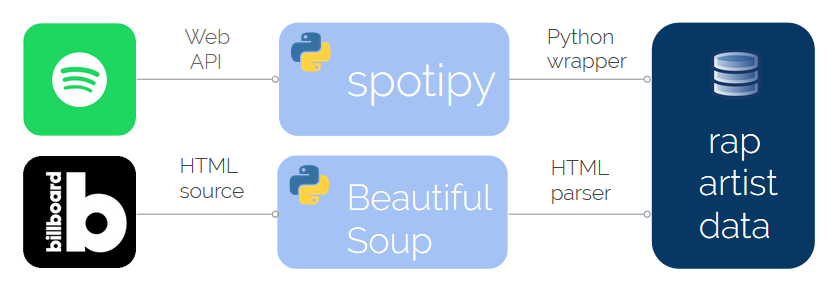

In [4]:
# artist pipeline
from IPython.display import Image
display(Image(filename='artist_pipeline.png', width=400))

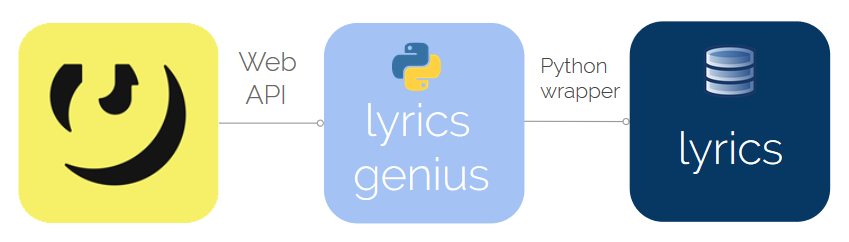

In [5]:
# lyrics pipeline
display(Image(filename='lyrics_pipeline.png', width=400))

### Choice of datasets
[Spotify](https://spotify.com/) is one of the most popular music streaming platforms.

[Genius](https://genius.com/) is regarded as one of the richest and highest-quality platforms for lyrics data.

We chose these data sources for their diversity and quality of data storage. Both services offer a rich, well-structured API with multiple open-source wrappers for different programming languages.

We decided to focus on rap music because it is a fast-paced and innovative industry. Additionally, rap lyrics have a diverse vocabulary full of slang, which makes it an exciting challenge in natural language processing.

### End user experience

We want to present users a snapshot of the hip-hop industry in 2019. We aim to uncover the different communities within the rap network and the lyrical themes that connect each community.

In the end, the user can see basic statistics about each community, including the most relevant terms, the most referenced entities, and the spread of sentiment scores per song.

## Part 2: Data Collection and Statistics

### Importing necessary libraries

In [ ]:
import spotipy
import pandas as pd
import lyricsgenius as genius
import os
import io
import re
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain
from spotipy.oauth2 import SpotifyClientCredentials #To access authorised Spotify data
from IPython.display import clear_output
import json

### Authorisation
Both the Spotify and the Genius APIs require authorisation. The API keys were saved as environment variables on a local machine to prevent leaking of secrets. 

In [ ]:
# hiding API keys as environment variables
client_id = os.environ["spotify_client_id"]
client_secret = os.environ["spotify_client_secret"]
genius_client_id = os.environ["genius_client_id"]
genius_client_secret = os.environ["genius_client_secret"]
genius_access_token = os.environ["genius_access_token"]

client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager) #spotify object to access API
api = genius.Genius(genius_access_token, verbose=False)

### Using spotipy to search for US Hip Hop playlists

Our first step to getting a dataset of artists is to scrape hip-hop playlists using the spotipy API, and extracting artists from that list. 

In [4]:
id_genre = None
list_playlists = []

for pl in sp.categories('US')['categories']["items"]:
    if pl["name"]=="Hip-Hop":
        id_genre = pl['id']
        
for pl in sp.category_playlists(id_genre,limit=20)['playlists']['items']:
    list_playlists.append([pl['id'], pl['owner']['id']])

Our initial dataset of artists through this method was rather small (around 250 artists). To increase the size, we manually searched for hip hop playlists on spotify, and copied their spotify playlist id's into our total list of playlists 

In [6]:
list_playlists.append(["5Djnt1SjSdvkAWm41tVAZB","grefml3x5uyg5fh5hcw9dr8l0"])
list_playlists.append(["4XkrraFkAm0DkZCPbn9ZrE","ikieq4wkohs9xnv5jx9k6wyek"])
list_playlists.append(["0uER1r1r2uOrKo5ZYnvshr","isaacd14"])
list_playlists.append(["7f7B3me1d6zqbMZyPcRiWA","iloveplaylists"])
list_playlists.append(["7udfzsaW6Y0hach8NgNXdQ","9nlf59f2vwpn8ptrmsv5emtjc"])
list_playlists.append(["7CXyK6Yz2TM09HadewOzlN","dtb109"])
list_playlists.append(["47tPeAeyuhMQhrTkWh2zor","1127629629"])
list_playlists.append(["7HQu1GUDVSx64GdCpaB88I","warnermusicus"])
list_playlists.append(["01pNIDYGqmeawppy32wr3D","warnermusicus"])
list_playlists.append(["7HQu1GUDVSx64GdCpaB88I","warnermusicus"])
list_playlists.append(["0pUsIxjbqlzmGmBxzeNICP","slice_music"])

df_playlists = pd.DataFrame(list_playlists, columns=["playlist_id","owner_id"])

He we have a dataframe that contain the playlist id and it's owner id. It will be used then to retrieve the tracks of each playlists.

In [7]:
df_playlists.head(100)

,playlist_id,owner_id
0,37i9dQZF1DXcDoDDetPsEg,spotify
1,37i9dQZF1DX6PKX5dyBKeq,spotify
2,37i9dQZF1DX0XUsuxWHRQd,spotify
3,37i9dQZF1DX0TrWIhtmeqJ,spotify
4,37i9dQZF1DX1eh709zIoRH,spotify
5,37i9dQZF1DWTuEPedcYvVB,spotify
6,37i9dQZF1DX186v583rmzp,spotify
7,37i9dQZF1DWVt4VCv1XXbY,spotify
8,37i9dQZF1DWSOkubnsDCSS,spotify
9,37i9dQZF1DWY4xHQp97fN6,spotify


### Creating a Dataframe of all artists names and their spotify ID's

Here, we loop through all playlists, and extract all unique artists (names and ID's) from those playlists and put in in a dataframe

In [8]:
artists_set = set()
artist_name_array = []

# iterating through all playlists
for index, row in df_playlists.iterrows():
    pl = sp.user_playlist(row['owner_id'],row['playlist_id'])
    
    # iterating through tracks per playlist 
    for i in pl['tracks']['items']:
        if(i['track'] != None):
            artist_name = i['track']['artists'][0]['name']
            artist_id = i['track']['artists'][0]['id']
            
            # avoiding duplicates, then adding to set of artists
            if artist_name not in artists_set:
                #print(artist_name)
                artist_name_array.append([artist_name,artist_id])
                artists_set.add(artist_name)

In [41]:
df_names = pd.DataFrame(ArtistNameArray, columns=["artist_name","artist_id"])
#df_names.to_csv(r'hiphopArtists_new.csv')

In [42]:
df_names.tail()

,artist_name,artist_id
910,Maesu,2kk1THOr0gsQaAqOj02tbl
911,Larry June,1grN0519h2zYqpRtYbDZAl
912,Hoodboi,1521R3ksLyQyFeqdtaSZUZ
913,The Internet,7GN9PivdemQRKjDt4z5Zv8
914,Channel Tres,4cUkGQyhLFqKHBtL58HYVp


### Storing all artists tracks in a JSON file (so we can load it later)

Now, we store all of the artists tracks in a JSON file. Each artists songs will appear in the JSON in this format:

```
 { 
     "artist_name_1":{
                      {
                        "tracks": [{track_id, track_name, feats: [feat1, feat2 ...], { }, ...], 
                        "artist_id":, artist_id
                      }  
      "artist_name_2": { ... }
 }
```                                  

In [10]:
df_artists = pd.read_csv(r'hiphopArtists_new.csv')

In [ ]:
all_songs = {}
all_real_songs = {}

# looping through each artists in the dataframe
for idx, row in df_artists.iterrows():
    #clear_output(wait = True)
    print("Downloading - "+str(idx*100/len(df_artists))+" %")
    tracks_infos = []
    
    artist_albums = sp.artist_albums(row["artist_id"],limit=50)['items']
    
    artist_name = row["artist_name"]
    artist_id = row["artist_id"]
    
    
    if(artist_albums != None):
        for album in artist_albums:

            alb_id = album['id']
            curr_artist_id = album['artists'][0]["id"]
            
            # Since the scraped albums may contain complations 
            #(which have songs not by the original artist), 
            # We check to see if the current albums artist matches 
            #the artist we are getting from the dataframe, 
            # so we don't accidentally add songs from other artists. 
            # We filter out potential repeat tracks later
            
            if  curr_artist_id == artist_id:

                for track in sp.album_tracks(alb_id,limit=50)['items']:

                    feats=[]
                    for art in track["artists"]:
                        # ensuring we don't add the original artist to the list of features. 
                        if art["id"] != artist_id:
                            feats.append(art["name"])

                    tracks_infos.append({"track_id":track['id'],"track_name": track['name'],"feats":feats})
  

    all_songs[artist_name]= {"tracks": tracks_infos, "artist_id": artist_id}
    

    
all_real_songs["artists"] = all_songs

In [48]:
with open('songs_with_feats_new.json', 'w') as outfile:
    json.dump(all_real_songs, outfile)

### Using lyricsgenius and spotipy to download top 5 lyrics per artist

In [ ]:
rappers_count = len(df_artists)
for i in range(rappers_count):
    
    artist = df_artists.iloc[i]
    # get top 10 tracks
    top_tracks = sp.artist_top_tracks(artist["artist_id"], country="US")["tracks"]
    top_tracks_names = [track["name"] for track in top_tracks]
    
    # remove following parantheses and dashes as these indicate song version or collaboration
    top_tracks_names = [re.sub(r"\(.*\)", "", track).strip() for track in top_tracks_names]
    top_tracks_names = [track.split("-")[0].strip() for track in top_tracks_names]
    
    # remove duplicates
    top_tracks_names = list(set(top_tracks_names))
    
    # get lyrics for each track
    for track in top_tracks_names[0:min(5, len(top_tracks_names))]:
        res = api.search_song(track, artist["artist_name"])
        filename = "lyrics_new/Lyrics_{}_{}.json".format(re.sub("[^a-zA-Z0-9 -]", "", artist["artist_name"]).replace(" ", ""),
                                                    re.sub("[^a-zA-Z0-9 -]", "", track).replace(" ", ""))
        # save to json
        if res is not None and res.title == track:
            # sometimes Genius finds the wrong result
            res.save_lyrics(filename = filename)

### Song metadata

In [6]:
song_list = pd.read_csv("song_info.csv")
song_list.head(5)

,song_title,artist_id_spotify,artist_name_spotify,artist_name_genius,song_date,song_filename
0,Bouff Daddy,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2017-05-12,Lyrics_JHus_BouffDaddy.json
1,Daily Duppy,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2015-05-21,Lyrics_JHus_DailyDuppy.json
2,Dark Vader,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2018-05-30,Lyrics_JHus_DarkVader.json
3,Did You See,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2017-03-02,Lyrics_JHus_DidYouSee.json
4,Disaster,2a0uxJgbvvIRI4GX8pYfcr,J Hus,Dave,2019-03-08,Lyrics_JHus_Disaster.json


We have 4073 songs in total:

In [8]:
len(song_list)

4073

The data frame consists of the following columns:
* **song_title**: title of the song as listed on the Genius website
* **artist_id_spotify**: Spotify URI of the artist for easier access in the API
* **artist_name_spotify**: name of the artist on Spotify
* **artist_name_genius**: name of the artist on Genius. Note that the two names are not necessarily the same. This may be due to stylistic differences or because the artist was a second collaborator on a song. We adhere to **artist_name_spotify** for the analysis but **artist_name_genius** allows for an easier search in the Genius Python wrapper
* **song_date**: date at which the song was released
* **song_filename**: filename of the song in the *lyrics* directory.

The lyrics were collected for 810 artists:

In [11]:
song_list.groupby("artist_name_spotify").size().sort_values()

artist_name_spotify
Championxiii       1
Dibo               1
Lonr.              1
Rebecca Winter     1
Manzo Soul         1
                  ..
Kurupt             9
M.O                9
Santi              9
Blu               16
Dave              16
Length: 810, dtype: int64

Note that some of these artists did not have enough lyrics uploaded on Genius and therefore do not have the expected five lyrics files.

We can also look at the most common years of release for the lyrics. We expect that since this is a dataset of popular lyrics, the majority of them were released in tha past five years. A quick analysis confirms our expectation:

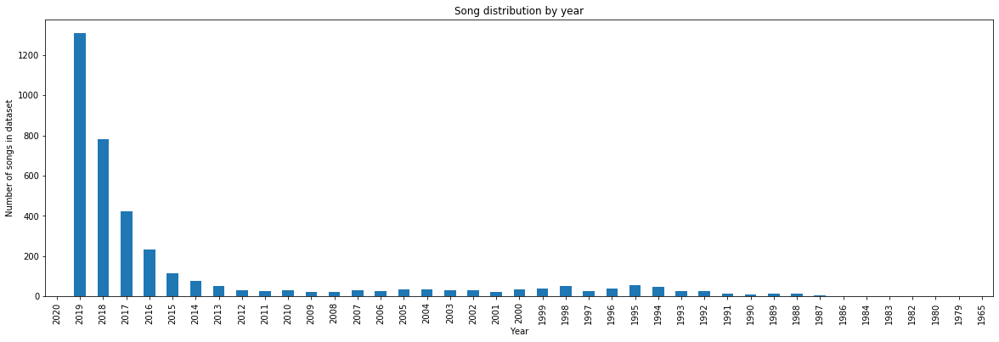

In [12]:
# filter out null values
years = song_list.dropna()["song_date"].apply(lambda date: date.split("-")[0])
years = years.sort_values(ascending=False)
years = years[years != "0001"]

# draw a histogram
plt.figure(figsize=(20,6))
years.value_counts().sort_index(ascending=False).plot(kind="bar")
plt.xticks(rotation="vertical")
plt.xlabel("Year")
plt.ylabel("Number of songs in dataset")
plt.title("Song distribution by year")
plt.show()

Indeed, the majority of the songs was released in the past five years. One song's release year was marked as the future 2020 in the dataset.

### Summary of Basic Stats:

For our network, we have scraped data the songs and collaborators of 914 artists, have lyrics collectd from 810 artists, (with 4073 total songs, with 18 megabytes of text. In the following section, we will then build the network and then provide some more basic stats about that. 

## Part 3: Tools, Theory, and Analysis

In this section, we will build our network given our saved cache of artists and their featured songs, as well as analyze the lyrics of each community of artists to extract interesting insights. In the network, we will use a variety of tools to analyze the network of rappers better. 

## Building the collaboration network

#### Importing necessary libraries

In [95]:
import json
import spotipy
import pandas as pd
import io
import os
import re
import networkx as nx
import matplotlib.pyplot as plt
import collections
from fa2 import ForceAtlas2 
from networkx.readwrite import json_graph
import numpy as np
from matplotlib import colors
import operator
from community import community_louvain
import matplotlib.colors as pltcolors
import urllib

import string
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import *
from nltk import FreqDist
from collections import Counter
from collections import OrderedDict
from itertools import islice
from wordcloud import WordCloud

In [7]:
df_artists = pd.read_csv(r"hiphopArtists_new.csv")
df_artists = df_artists.drop("Unnamed: 0", axis=1)

In [8]:
nameList = list(df_artists["artist_name"])

In [9]:
df_artists.tail(10)

,artist_name,artist_id
905,Junglepussy,6atGQM99IrRfUefJFore1B
906,Deem Spencer,4iXaGootDLE50qY42LCdnK
907,Denzel Curry,6fxyWrfmjcbj5d12gXeiNV
908,Havelock,3AIAml2wCQUDhWt0BffVbA
909,Alex Gough,1rNNeas60ogZm9uhv1VZOh
910,Maesu,2kk1THOr0gsQaAqOj02tbl
911,Larry June,1grN0519h2zYqpRtYbDZAl
912,Hoodboi,1521R3ksLyQyFeqdtaSZUZ
913,The Internet,7GN9PivdemQRKjDt4z5Zv8
914,Channel Tres,4cUkGQyhLFqKHBtL58HYVp


In [10]:
if 'songs_with_feats_new.json':
    with open('songs_with_feats_new.json', 'r') as f:
        songs = json.load(f)

In this step, we make a dictionary where every artist's name is a key, and the value is another dictionary, containing each artist he/she collaborated with as a key, and the number of songs they collaborated on. Thus ...

```python
artist_collab_dict["rapper1"]["rapper2"]
```

should return the number of songs rapper 2 has been on rapper 1's songs

#### Building the collaboration dictionary (to be used when creating the graph)

In [11]:
total_songs = []
artist_tracks_data = songs["artists"]
artist_collab_dict = {}
        
for artist_name, artist_tracks in artist_tracks_data.items():
    
    # The inner dictionary that is the value for the artist's name as the key
    collabs = {}
    track_lookup = set() 
    
    for track in artist_tracks["tracks"]:
        
        feats = track['feats']
        track_name = track['track_name']
        
        # Ensuring that the artist has collaborators and we haven't processed the same track twice
        if len(feats) > 0 and track_name not in track_lookup:
            track_lookup.add(track['track_name'])
            
            for feat_artist in feats:
                # Checking to see if the featured artist is in our dataframe 
                if feat_artist in nameList:
                    # add a new entry to the dictionary or increment the total collaborations
                    if feat_artist not in collabs:
                        collabs[feat_artist] = 1
                    else:
                        collabs[feat_artist] += 1
                        
    if len(collabs) > 0:
        artist_collab_dict[artist_name] = collabs

An sample entry in our dictionary. Here, we can see all of Drake's collaborators and how many songs they have been on. 

In [12]:
artist_collab_dict["Drake"]

{'J. Cole': 1,
 'Rick Ross': 3,
 'Lil Wayne': 10,
 'Lloyd': 1,
 'Santigold': 1,
 'Omarion': 1,
 'Giggs': 2,
 'Jorja Smith': 1,
 'Travis Scott': 2,
 '2 Chainz': 2,
 'Young Thug': 2,
 'Kanye West': 1,
 'PARTYNEXTDOOR': 4,
 'WizKid': 1,
 'Future': 11,
 'Rihanna': 2,
 'Big Sean': 1,
 'Kendrick Lamar': 1,
 'Nicki Minaj': 3,
 'Alicia Keys': 1,
 'T.I.': 1}

#### Creating the network from the collaboration dictionary

Here, we are creating the network. First, we add every node, and give it a weight equal to its degree. We also add edges as follows: First, we iterate through every artist, and all of his collaborators, adding an edge between each artist and his collaborator. We also make sure that artists who have no collaborations with other artists in our dataset are removed from the network. 

If we add an edge between artist A and B, and already see there was an edge created between artists B and A, we update the weight of that edge to be the sum of number of songs from A featuring B, and the number of songs from B featuring A.  

In [13]:
G_rap = nx.Graph()

# we create an dictionary of edges we have already added. Each entry is of the form (A, B) --> num_songs
# where A is the main artist, B is the collaborator, and num_songs = the number of songs they worked on
lookup_edges = {}

# adding nodes
for artist, collabs in artist_collab_dict.items():
    G_rap.add_node(artist, weight=len(collabs), collabs = set(collabs.keys()))
    
# adding edges
for artist, collabs in artist_collab_dict.items():
    for collab, num_songs in collabs.items():
        
        lookup_edges[(artist, collab)] = num_songs
        G_rap.add_edge(artist, collab, weight = num_songs)
        
        # add in collaborations in reverse direction
        if (collab, artist) in lookup_edges:
            num_songs_reverse = lookup_edges[(collab, artist)]
            G_rap.add_edge(artist, collab, weight = num_songs + num_songs_reverse)

## Analyzing the Network

#### A quick look at the network size

Important Note:  Since we made sure that artists who have no collaborations with other artists in our dataset are not included in the network, our network size goes from 914 to 720 artists. 

In [14]:
print("Total number of nodes:" ,len(G_rap))
print("-----------")
print("Total number of links", G_rap.size())
print("-----------")
print("Density", nx.density(G_rap))

Total number of nodes: 720
-----------
Total number of links 4103
-----------
Density 0.015851491268737444


#### Does the rapper network like a typical social network or more like a random network?

To answer this question, we are interested in seeing if the degree distributions rappers look more logarithmic or normal in nature. Are rappers collaborating at random, or are there major hubs who keep the network connected?

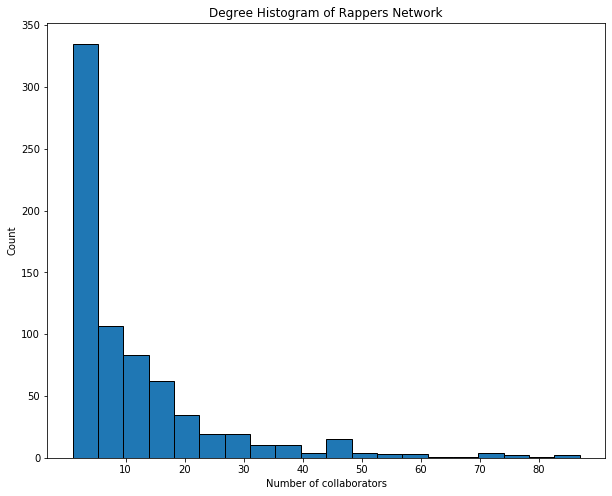

In [15]:
# Degree Distribution
degrees = [G_rap.degree(n) for n in G_rap.nodes()]
plt.figure(figsize = (10, 8))
plt.hist(degrees, bins = 20, edgecolor='black', )
plt.xlabel('Number of collaborators')
plt.ylabel('Count')
plt.title('Degree Histogram of Rappers Network')
plt.xticks(list(range(10, 90)[::10]))
plt.show()

Here, we can see that the degree distribution looks quite logarithmic and models that of the preferential attachment/BA network model (as expected)

In [16]:
degree_sequence = sorted([d for n, d in G_rap.degree()], reverse=True)
rap_sorted = sorted(G_rap.degree, key=lambda x: x[1], reverse=True)
print("- Top 10 by degree -")
for i in range(0,10):
    print("#"+str(i+1)+" :")
    print("Rapper: ",rap_sorted[i][0])
    print("Total collaborators: ", rap_sorted[i][1])
    print('-----')

- Top 10 by degree -
#1 :
Rapper:  Snoop Dogg
Total collaborators:  87
-----
#2 :
Rapper:  Chris Brown
Total collaborators:  83
-----
#3 :
Rapper:  2 Chainz
Total collaborators:  79
-----
#4 :
Rapper:  Gucci Mane
Total collaborators:  76
-----
#5 :
Rapper:  Rick Ross
Total collaborators:  76
-----
#6 :
Rapper:  Young Thug
Total collaborators:  72
-----
#7 :
Rapper:  Future
Total collaborators:  71
-----
#8 :
Rapper:  Busta Rhymes
Total collaborators:  71
-----
#9 :
Rapper:  Lil Wayne
Total collaborators:  71
-----
#10 :
Rapper:  French Montana
Total collaborators:  69
-----


#### Who are the most influential artists? 

Another natural question to ask is which artists are the most influential in our network. To analyze this, we will look at various measures of Centrality (Degree, Betweenness, and Eigenvector), and compare them against each other to answer thisi question. 

##### Top 20 Artists by Degree Centrality

In [17]:
# Degree Centrality
deg_ctrs = [(k, v) for k, v in nx.degree_centrality(G_rap).items()]
sorted(deg_ctrs, key=lambda x: x[1], reverse = True)[:20]

[('Snoop Dogg', 0.12100139082058414),
 ('Chris Brown', 0.11543810848400556),
 ('2 Chainz', 0.10987482614742698),
 ('Gucci Mane', 0.10570236439499305),
 ('Rick Ross', 0.10570236439499305),
 ('Young Thug', 0.10013908205841446),
 ('Future', 0.09874826147426981),
 ('Busta Rhymes', 0.09874826147426981),
 ('Lil Wayne', 0.09874826147426981),
 ('French Montana', 0.09596662030598052),
 ('Wiz Khalifa', 0.08623087621696801),
 ('T.I.', 0.08484005563282336),
 ('Meek Mill', 0.07927677329624479),
 ('E-40', 0.07927677329624479),
 ('Rich The Kid', 0.07788595271210014),
 ('The Game', 0.07649513212795549),
 ('YG', 0.07510431154381085),
 ('DJ Drama', 0.07232267037552155),
 ('Yo Gotti', 0.06815020862308761),
 ('Nicki Minaj', 0.06815020862308761)]

##### Top 20 Artists by Betweenness Centrality

In [18]:
# Betweenness Centrality
bt_ctrs = [(k, v) for k, v in nx.betweenness_centrality(G_rap).items()]
sorted(bt_ctrs, key=lambda x: x[1], reverse = True)[:20]

[('Snoop Dogg', 0.0539072730070342),
 ('French Montana', 0.04443079126965523),
 ('Chip', 0.043826144856047376),
 ('Busta Rhymes', 0.04085951321764177),
 ('Chris Brown', 0.03942006350587971),
 ('Giggs', 0.038974791395502806),
 ('Rick Ross', 0.03706952602873264),
 ('Skepta', 0.03247284683548266),
 ('Wiley', 0.030164823999891913),
 ('Tory Lanez', 0.02940530094357589),
 ('Gucci Mane', 0.029186919232268616),
 ('Lil Baby', 0.028966796077123082),
 ('2 Chainz', 0.027802419674560052),
 ('Future', 0.027767416092211797),
 ('Stefflon Don', 0.027611995378990783),
 ('Young Thug', 0.026871523051060917),
 ('Estelle', 0.025190180341218744),
 ('Wiz Khalifa', 0.02418750837805091),
 ('Lil Yachty', 0.022083729493435834),
 ('Rich The Kid', 0.021341210487594107)]

##### Top Artists by Eigenvector Centrality

In [19]:
# Eigenvector Centrality
eig_ctrs = [(k, v) for k, v in nx.eigenvector_centrality(G_rap).items()]
sorted(eig_ctrs, key=lambda x: x[1], reverse = True)[:20]

[('2 Chainz', 0.19251625821691187),
 ('Chris Brown', 0.1906224055289425),
 ('Rick Ross', 0.18035465858523805),
 ('Future', 0.17643733761861471),
 ('Lil Wayne', 0.17520973480840035),
 ('Gucci Mane', 0.17390190120567842),
 ('French Montana', 0.15762281562794814),
 ('Snoop Dogg', 0.15686917186189697),
 ('T.I.', 0.1556456670226622),
 ('Young Thug', 0.15425104835368575),
 ('Meek Mill', 0.15086644620204),
 ('DJ Drama', 0.1489532273928032),
 ('Wiz Khalifa', 0.147593716984187),
 ('The Game', 0.14509824870350885),
 ('Yo Gotti', 0.13610102309493408),
 ('Big Sean', 0.1344315435007818),
 ('Busta Rhymes', 0.12722459851724688),
 ('Tyga', 0.12456428133665573),
 ('Nicki Minaj', 0.12445208911640977),
 ('YG', 0.11840119479245816)]

#### Plots of Degree vs Eigenvector and Betweenness Centrality

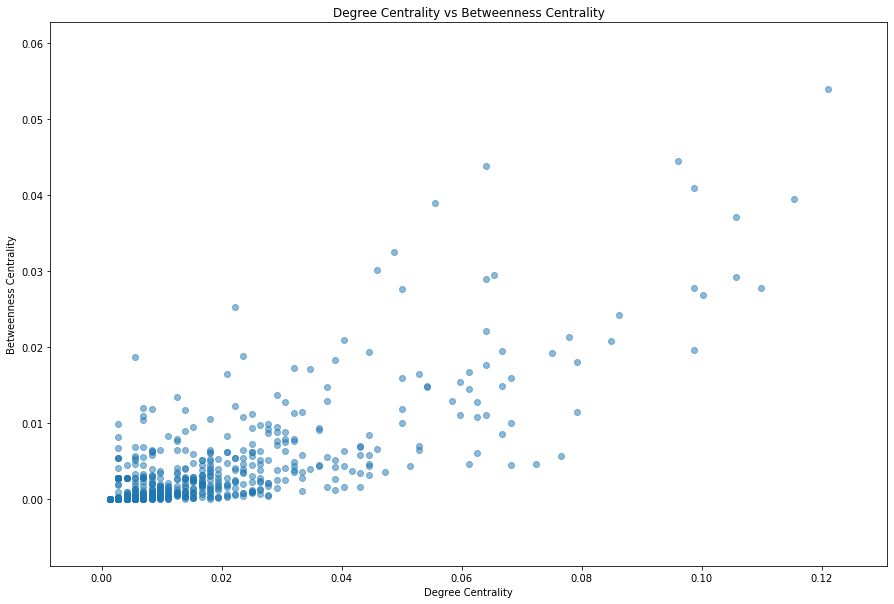

In [20]:
# Degree vs Betweenness Centrality
deg_ctr_dict = nx.degree_centrality(G_rap)
bt_ctr_dict = nx.betweenness_centrality(G_rap)
eig_ctr_dict = nx.eigenvector_centrality(G_rap)

x = [v for k, v in deg_ctr_dict.items()]
y = [bt_ctr_dict[k] for k in deg_ctr_dict.keys()]

plt.figure(figsize=(15,10))
plt.scatter(x, y, alpha = 0.5)
plt.title('Degree Centrality vs Betweenness Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Betweenness Centrality')
plt.show()

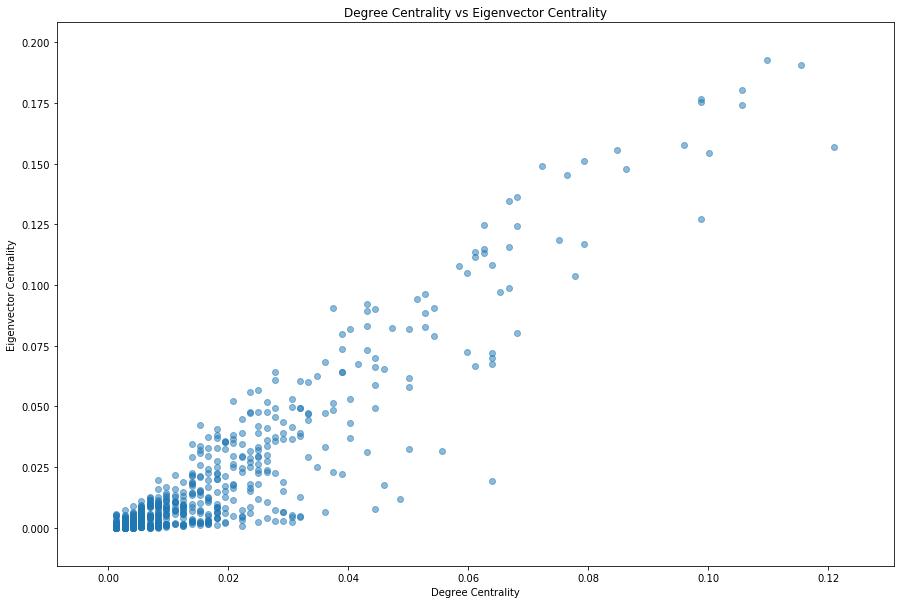

In [21]:
# Degree vs Eigenvector Centrality
x = [v for k, v in deg_ctr_dict.items()]
y = [eig_ctr_dict[k] for k in deg_ctr_dict.keys()]


plt.figure(figsize=(15,10))
plt.scatter(x, y, alpha = 0.5)
plt.title('Degree Centrality vs Eigenvector Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Eigenvector Centrality')
plt.show()

It's interesting to note how well Degree Centrality aligns much better with Eigenvector Centrality than Betweenness Centrality. 

Eigenvector centrality measures a node's "influence" on a network, since it takes into account the degree of a node's neighbors in the metric (so a node with many high degree neighbors is given a high eigenvector centrality score). 

Since the correlation is so linear, we can guess that a rapper's number of collaborators is a good measure of his influence. High degree rappers are collaborating with other high degree rappers, and similarly for low degree rappers. This makes sense -- as a high degree rapper is probably very well known in the industry and has the power to collaborate with other very popular artists. However, a low degree, up and coming rapper who doesn't have the same influence is likely to collaborate with someone also with low degree -- "within his league", so to speak.

To conclude, we can guess that the most influential artists are those with the highest eigenvector centrality. 

#### How many songs do artists work together on? 

Here, we we want to now look at the distribution of the edge weights (the edge weight between artist A and B) is the number of total songs they have collaborated on. We can use our plot a histogram of our edge weights to see this. 

In [22]:
edge_weights = [d['weight'] for (u, v, d) in G_rap.edges(data=True)]

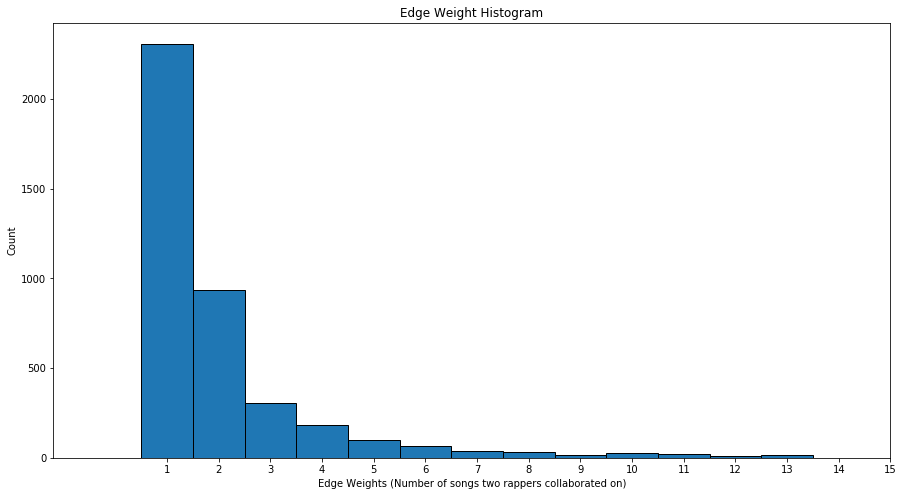

In [23]:
bins = np.arange(15)

frq, cnts = np.histogram(edge_weights, bins)

plt.figure(figsize = (15, 8))
#fig, ax = plt.subplots()
plt.bar(cnts[:-1], frq, width=np.diff(cnts), ec="k", align="center")
plt.xlabel('Edge Weights (Number of songs two rappers collaborated on)')
plt.ylabel('Count')
plt.title('Edge Weight Histogram')
plt.xticks(list(range(1, 16)))
plt.show()

We can see that an overwhelming number of artists only collaborate on just one song together. This makes sense considering how many artists are of low degree (as seen by our degree distribution)

#### How assortative is our network?

Here, we would like to get some basic measures of assortativity and clustering measurements of the networks and compare them to some common benchmarks. 

In [25]:
nx.degree_assortativity_coefficient(G_rap)

0.1977133078594039

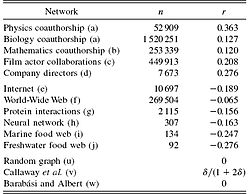

In [4]:
from IPython.display import Image
display(Image(filename='assortativity_benchmarks.jpg'))

We can compare our assortativity coefficient to the following benchmarks, found from Wikipedia (The column on the right is the assortativity coefficent.) 

Here, we see that our network is slightly assortative -- more assortative than the Barabasi Albert model, and quite similar to the Film Actor Collaborations network. (0.1977 vs 0.208), but less than Physics Coauthorship. 

#### Which artists are up and coming? 

Here, we would like to empirically determine which artists are "up-and coming". We can define this by looking at the average degree of an artists neighbors, and see which ones are the highest. What this is likely to mean is that this artist has collaborated with very influential artists (as we see in the correlation between degree and eigenvector centrality.

Some up and coming artists (low-degree artists who have collabs with very high-degree figures

In [26]:
# Average Neighbor Degree
sweg = nx.average_neighbor_degree(G_rap)
sorted(sweg.items(), key=operator.itemgetter(1), reverse = True)[:10]
#sorted(dict(sorted_x), key=lambda x: x[1], reverse = True)[:20]

[('T.R.U.', 79.0),
 ('Nicole Bus', 76.0),
 ('euro', 71.0),
 ('Ayanis', 62.0),
 ('Yung Joc', 56.09090909090909),
 ('83 Babies', 56.0),
 ('FKA twigs', 55.0),
 ('O.T. Genasis', 51.11764705882353),
 ('Juvenile', 50.53333333333333),
 ('Dame D.O.L.L.A', 49.5)]

In [27]:
def get_collaborators(artist):
    print(artist)
    return [neighbor for neighbor in G_rap.neighbors(artist)]

In [28]:
print(get_collaborators("T.R.U."))
print(get_collaborators("Nicole Bus"))
print(get_collaborators("euro"))
print(get_collaborators("Juvenile"))

T.R.U.
['2 Chainz']
Nicole Bus
['Rick Ross']
euro
['Lil Wayne']
Juvenile
['Gucci Mane', 'Future', 'Yo Gotti', 'T.I.', 'The Game', 'Snoop Dogg', '50 Cent', 'Fat Joe', 'Ludacris', 'Lil Wayne', 'Chris Brown', 'Dame D.O.L.L.A', 'DJ Drama', 'Missy Elliott', 'Ying Yang Twins']


Looking at some of these artists connections, we can see that they've collaborated with the influential figures mentioned in the degree/eigenvector centrality measures. 

## Community Detection and Lyric Analysis

Here, we would like to partition our network into communities (using the louvain algorithm), and analyze how the lyrics (and their sentiments) differ between communities. 

We have saved a cache of the communities detected by the louvain algorithm (since it returns a slightly different set of communities each time it is run). The code we used to generate the communities is ...

```python
giant = max([G_rap.subgraph(c) for c in nx.connected_components(G_rap)], key=len)
partition = community_louvain.best_partition(giant)
communities = list(set(partition.values()))
```


First, we will tie in the text analysis component of the project. We will take a look at the lyrics of each artists (at most 5) popular songs, then save the lyrics of all artists of a specific community in a file. We will in the end, have 9 files, each containing the lyrics of all the artists in that community. Afterwards, we will run a TF-IDF and sentiment analysis on each set of lyrics to extract (hoepfully) interesting insights

Loading the communities file, with the community number (from 0 - 9) saved for each artist 

In [29]:
with open('communities.json', 'r') as f:
    communities = json.load(f)

print(list(communities.items())[:10])

[('J Hus', 0), ('PARTYNEXTDOOR', 1), ('Stormzy', 0), ('Dave', 0), ('Darkoo', 0), ('ZieZie', 0), ('Tory Lanez', 1), ('Young T & Bugsey', 0), ('Geko', 0), ('Fredo', 0)]


In [30]:
community_list = sets = [set() for _ in range(10)]

for artist, community_idx in communities.items():
    community_list[community_idx].add(artist)

Looking at the relative sizes of the communities

In [31]:
comm_sizes = [len(comm) for comm in community_list]
print (comm_sizes)

[221, 97, 125, 70, 55, 101, 5, 21, 9, 4]


Now, we want to clean the lyrics of each song so they are ready for processing by TF-IDF. Here is an example of what is returned by the Genius API

In [35]:
fname = os.path.join("lyrics_new/Lyrics_Drake_OneDance.json")
with open(fname, 'r') as f:
    song_data = json.load(f)
    song_lyrics = song_data['songs'][0]['lyrics']
    print(song_lyrics)
    
f.close()

[Intro: Kyla]
Baby, I like your style

[Verse 1: Drake]
Grips on your waist, front way, back way
You know that I don't play
Streets not safe but I never run away
Even when I'm away
Oti, oti
There's never much love when we go OT
I pray to make it back in one piece
I pray, I pray

[Chorus: Drake]
That's why I need a one dance
Got a Hennessy in my hand
One more time 'fore I go
Higher powers taking a hold on me
I need a one dance
Got a Hennessy in my hand
One more time 'fore I go
Higher powers taking a hold on me

[Refrain: Kyla]
Baby, I like your style

[Verse 2: Drake]
Strength and guidance
All that I'm wishing for my friends
Nobody makes it from my ends
I had to bust up the silence
You know you gotta stick by me
Soon as you see the text, reply me
I don't wanna spend time fighting
We've got no time

[Chorus: Drake]
And that's why I need a one dance
Got a Hennessy in my hand
One more time 'fore I go
Higher powers taking a hold on me
I need a one dance
Got a Hennessy in my hand
One more ti

In addition to removing punctuation, stopwords, and numbers, we also want to remove the text in bracks signifying who is singing the verse. Since there is also a lot of slang and concatenations in rap music, (e.g. movin' instead of moving), we will try approaches with stemming and non-stemming and see which gives us better insights (Since some slang words (ain't) we want to appear in our TF-IDF, while others (movin' vs moving) we would like to stem). 

#### Defining a function which prepares the lyrics of each song for a TF-IDF analysis

In [37]:
def cleaned_lyrics(lyrics, artists):
    # lowercasing text
    lyrics = lyrics.lower()
        
    # removing numbers
    lyrics = re.sub(r'\d+', '', lyrics)
    
    # removing bracketed text
    lyrics = re.sub("[\[].*?[\]]", '', lyrics)

    # Removing Punctuation
    lyrics = lyrics.translate(str.maketrans('', '', string.punctuation))
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(lyrics)
    
    # removing stop words
    stop_words = set(stopwords.words('english')) 
    tokens = [token for token in tokens if token not in stop_words] 
    lyrics = " ".join(tokens)
    
    return lyrics

In [38]:
print(cleaned_lyrics(song_lyrics, ["Drake"]))

baby like style grips waist front way back way know dont play streets safe never run away even im away oti oti theres never much love go ot pray make back one piece pray pray thats need one dance got hennessy hand one time fore go higher powers taking hold need one dance got hennessy hand one time fore go higher powers taking hold baby like style strength guidance im wishing friends nobody makes ends bust silence know gotta stick soon see text reply dont wanna spend time fighting weve got time thats need one dance got hennessy hand one time fore go higher powers taking hold need one dance got hennessy hand one time fore go higher powers taking hold got pretty girl love long time wine wine long time oh yeah long time back back back wine back back wine girl back back back wine oh yeah long time back back wine girl tell need know wanna go cause youre ill take slow make lose control oh yeah long time back back wine girl cause youre back back cause youre back back cause youre back back need

We open a dataframe of all the song lyrics in our dataset, so we can parse through the files. Our goal is to take at most 5 songs from each artist, and put their lyrics in a file which contains all the lyrics from their community. 

In [39]:
import os

directory = os.fsdecode("lyrics_new/")

songs_df = pd.read_csv('song_info.csv')
songs_df.head()

,song_title,artist_id_spotify,artist_name_spotify,artist_name_genius,song_date,song_filename
0,Bouff Daddy,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2017-05-12,Lyrics_JHus_BouffDaddy.json
1,Daily Duppy,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2015-05-21,Lyrics_JHus_DailyDuppy.json
2,Dark Vader,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2018-05-30,Lyrics_JHus_DarkVader.json
3,Did You See,2a0uxJgbvvIRI4GX8pYfcr,J Hus,J Hus,2017-03-02,Lyrics_JHus_DidYouSee.json
4,Disaster,2a0uxJgbvvIRI4GX8pYfcr,J Hus,Dave,2019-03-08,Lyrics_JHus_Disaster.json


Creating our community lyric files

In [42]:
processed_songs = {} 
dir_name = "./lyrics_new/"


# iterating through all of our songs
for i, row in enumerate(songs_df.iterrows()):
    
    artist_name = row[1]["artist_name_spotify"]
    fname = row[1]["song_filename"]
    song_title = row[1]["song_title"]
    
    fname = dir_name + fname
    
    with open(fname, 'r') as f:
        song_data = json.load(f)

    song_lyrics = song_data['songs'][0]['lyrics']
    
    # ensure that we process up to at most 5 songs per artist
    if (artist_name not in processed_songs):
        if artist_name in communities:
            
            processed_songs[artist_name] = 1
            cleaned_txt = cleaned_lyrics(song_lyrics, [artist_name])
        
            community_num = communities[artist_name]
            comm_file = open("community_" + str(community_num) + "_lyrics.txt", "a+", encoding="utf-8")

            comm_file.write(cleaned_txt)
            comm_file.close()
        
        
    elif (processed_songs[artist_name] < 5):
        if artist_name in communities:
            
            processed_songs[artist_name] += 1       
            cleaned_txt = cleaned_lyrics(song_lyrics, [artist_name])
        
            community_num = communities[artist_name]
            comm_file = open("community_" + str(community_num) + "_lyrics.txt", "a+", encoding="utf-8")

            comm_file.write(cleaned_txt)
            comm_file.close()


### What does the network look like? 

We start off by using ForceAtlas to visualize the structure of our network, without labels for now. 

In [43]:
giant = max([G_rap.subgraph(c) for c in nx.connected_components(G_rap)], key=len)
data = json_graph.node_link_data(giant)

In [44]:
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.5,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=0.5,
                        strongGravityMode=False,
                        gravity=1,

                        # Log
                        verbose=False)
        
positionsUN = forceatlas2.forceatlas2_networkx_layout(giant, pos=None, iterations=2000)

In [45]:
with open('positionsNetwork.json', 'w') as outfile:
    json.dump(positionsUN, outfile)

In [46]:
labelPos = {}
for el in positionsUN:
    labelPos[el] = (positionsUN[el][0],positionsUN[el][1]+2)

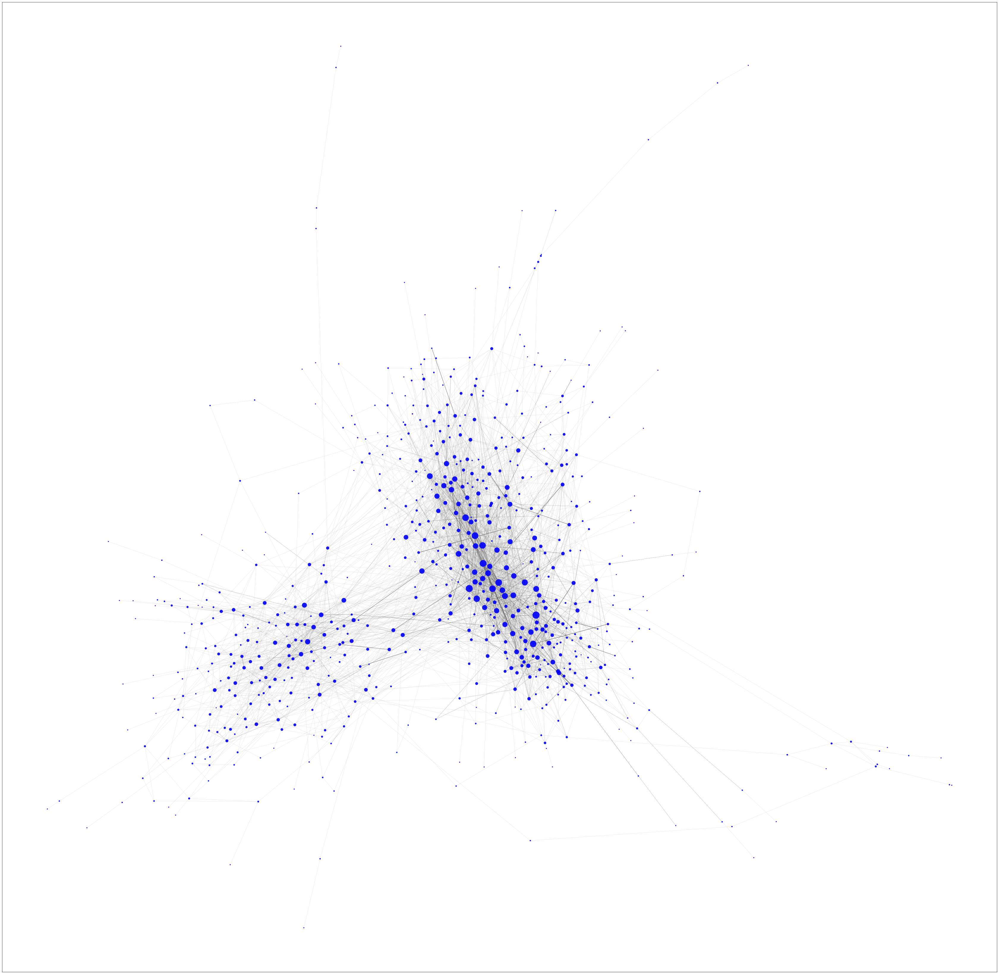

In [47]:
cmape = colors.LinearSegmentedColormap.from_list('custom blue', 
                                             [(0,    (0.3, 0.3, 0.3)),
                                              (1,    (0,0,0))], N=5)

fig= plt.figure(figsize=(60,60))
degrees = []


for i in giant:
    degrees.append(giant.degree[i]*6)
    
edges,weights = zip(*nx.get_edge_attributes(giant,'weight').items())

resWeights=[]
# we increase the visual weight on the edge given its actual weight. 
for w in weights:
    if(w<5):
        resWeights.append(0.1)
    elif(w<10):
        resWeights.append(0.3)
    elif(w<15):
        resWeights.append(0.5)
    elif(w<20):
        resWeights.append(0.8)
    elif(w<25):
        resWeights.append(1)
    
a= nx.draw_networkx_nodes(giant, positionsUN, node_size=degrees, with_labels=False, node_color="blue", alpha=0.9)
b= nx.draw_networkx_edges(giant, positionsUN, edges_list= edges,edge_color=weights,  edge_cmap=cmape, width=resWeights )
# c= nx.draw_networkx_labels(giant, labelPos,font_size=12)
#plt.savefig('HipHop_US_Network_900.png')

The network looks somewhat bipartite in this visualization -- although that might just be the way forceatlas decided to place the nodes. 

### Visualizing Communities

Using the Louvain community detection algorithm, we'd like to see what communities exist in our network and extract some interesting insights. For example, whether rappers of the same cities are working together (east coat vs west coast) for example

In [48]:
edgesWeight = dict(giant.edges)

In [49]:
edgesWeightList = []

for i in edgesWeight:
    fromArtist = list(i)[0]
    toArtist = list(i)[1]
    weight = edgesWeight[i]['weight']
    edgesWeightList.append({"from": fromArtist, "to": toArtist, "weight": weight})

In [50]:
with open('nodesDegree.json', 'w') as outfile:
    json.dump(list(giant.degree), outfile)

In [51]:
partition = community_louvain.best_partition(giant)
communities = list(set(partition.values()))
colors = list(pltcolors._colors_full_map.values())[0:len(communities)]
cmap = dict(zip(communities, colors))
print("The algorithm has identifies %.0f communities" %len(communities))

The algorithm has identifies 10 communities


Here is a visualization of our network, colored by communities and also assigned labels

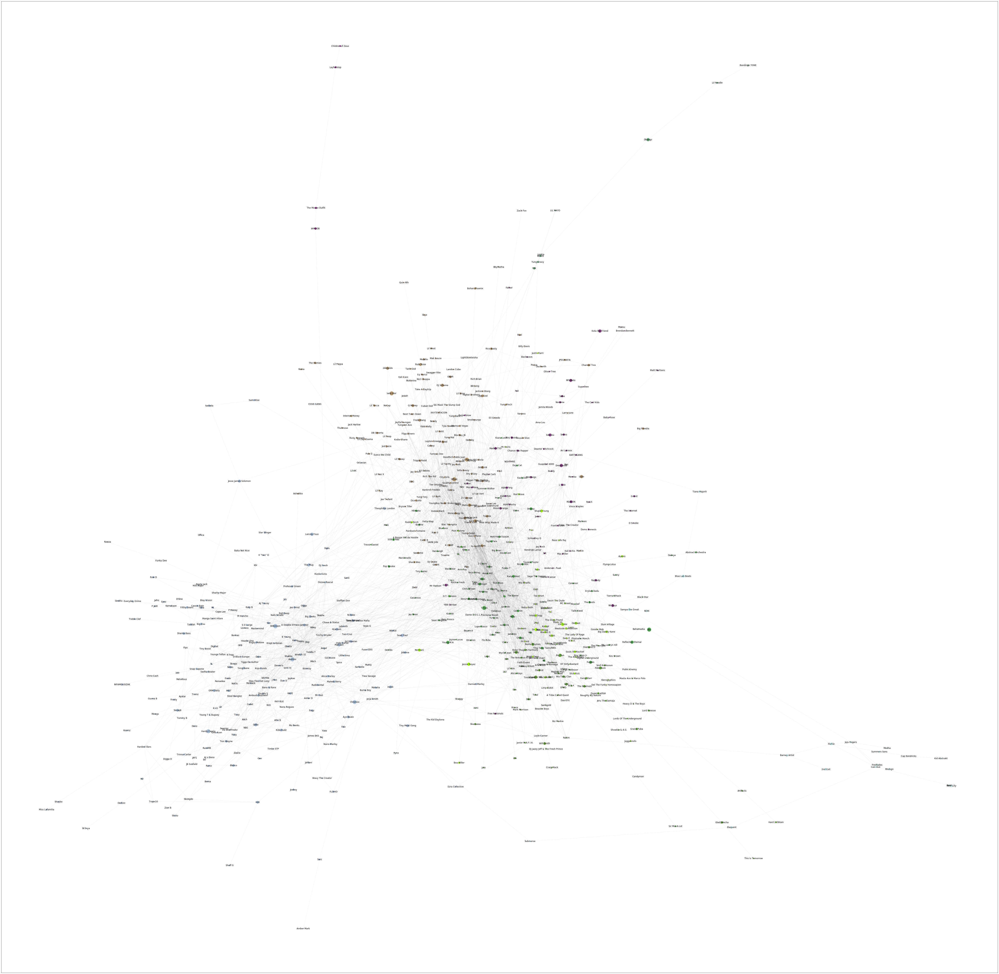

In [52]:
plt.figure(figsize = (100,100))
pos = positionsUN
count = 0.
for count, com in enumerate(communities):
    list_nodes = [nodes for nodes in partition.keys()
                                if partition[nodes] == com]
    nx.draw_networkx_nodes(giant, pos, list_nodes, node_size=degrees,
                                node_color = cmap.get(com), alpha= 1)

nx.draw_networkx_edges(giant,pos, alpha=0.06)
nx.draw_networkx_labels(giant, pos,font_size=12)
plt.show()

Its a bit difficult to see, but our website has a better visualization the the communities of the network. 

### What are the Most Relevant Terms per Community? (TF-IDF)
From now on, we will work with the consolidated lyrics files for each community. Our first step is to establish the vocabulary. We have decided to work with the LabMT dataset, as it contains a very rich selection of slang terms and helps us filter out some undesirable tokens.

#### Downloading LabMT (optional)

In [55]:
# Dataset text file url
dataset_url = "https://journals.plos.org/plosone/article/file?id=10.1371/journal.pone.0026752.s001&type=supplementary"

# Get the data and convert into utf-8
res = urllib.request.urlopen(dataset_url)
dataset = res.read().decode('utf-8')

# Write the file in a new one here
file = open("sentiment.txt","w")
file.write(dataset) 

405661

In [57]:
df_sentiment = pd.read_csv('sentiment.txt', delimiter="\t")
# vocabulary for this analysis
word_list = list(df_sentiment['word'])

In [58]:
df_sentiment.head()

,word,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
0,laughter,1,8.50,0.9313,3600,--,--,1728
1,happiness,2,8.44,0.9723,1853,2458,--,1230
2,love,3,8.42,1.1082,25,317,328,23
3,happy,4,8.30,0.9949,65,1372,1313,375
4,laughed,5,8.26,1.1572,3334,3542,--,2332


#### Compute TF-IDF for each community

In [59]:
# load consolidated file for each community
def tokenize_community(filename):
    with open(filename, "r", encoding="utf-8") as f:
        # tokenize file
        community = f.read()
        tokenizer = RegexpTokenizer(r"\w+")
        tokens = tokenizer.tokenize(community)
              
        # remove stop words
        stop_words = set(stopwords.words("english")) 
        tokens = [token for token in tokens if token not in stop_words]
        tokens = [token for token in tokens if token in word_list]
        
        return tokens

In [60]:
# create list of tokens for each community
community_tokens = {}
lyrics_path = "./community_lyrics"
lyrics_files = os.listdir(lyrics_path)
i = 0
for file in lyrics_files:
    # avoid checkpoint files
    if "lyrics" in file:
        community_tokens[i] = tokenize_community("{}/{}".format(lyrics_path, file))
        i += 1

In [61]:
# number of communities
N = len(community_tokens)

We first compute the term frequency value for each token in each community. Note that some tokens have large values because we use the raw count of a word as a TF metric.

In [67]:
tf = {}
for i in range(N):
    tf[i] = dict(Counter(community_tokens[i]))

We then compute TF-IDF for each token in each community.

In [69]:
idf = {}
tf_idf = {}
for i in range(N):
    idf[i] = {}
    tf_idf[i] = {}
    for word in tf[i].keys():
        docs_with_word = [j for j in range(N) if word in tf[j]]
        idf[i][word] = np.log(N / len(docs_with_word))
        tf_idf[i][word] = tf[i][word] * idf[i][word]

In [71]:
# helper function that sorts ordered dictionaries
def sort_freq_dict(d):
    return OrderedDict(sorted(d.items(), key=lambda t: t[1], reverse=True))

In [74]:
# order community tf-idf dictionaries
for i in range(N):
    tf_idf[i] = sort_freq_dict(tf_idf[i])

#### Generate wordcloud visualisations for each community

In [77]:
def generate_wordcloud(tf_idf_dict, word_limit, filename):
    wordcloud_string = []
    i = 1
    
    # creating string with repetitions of word equal to tfidf value
    for k in tf_idf_dict.keys():
        word_magnitude = [k] * int(round(tf_idf_dict[k]))
        wordcloud_string.extend(word_magnitude)

        if i == word_limit:
            break

        i+=1

    wordcloud_string = " ".join(wordcloud_string)
    
    # Generate a word cloud image
    wordcloud = WordCloud().generate(wordcloud_string)

    # lower max_font_size
    wordcloud = WordCloud(background_color = "white" , collocations=False).generate(wordcloud_string)
    plt.figure(figsize = (10,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.savefig(filename)

#### Community #0

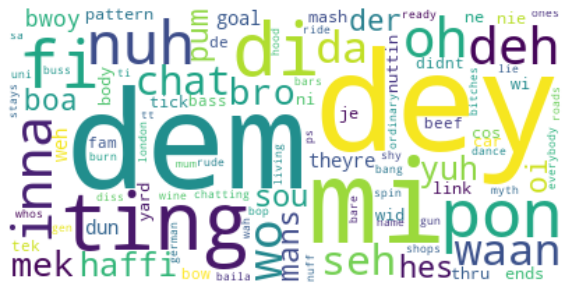

In [78]:
generate_wordcloud(tf_idf[0], 100, "wordcloud0.png")

Community 0 exhibits a diverse use of slang (common to Canadian and UK-based rappers). A closer look into the community shows that it consists largely of UK-based artists.

#### Community #1

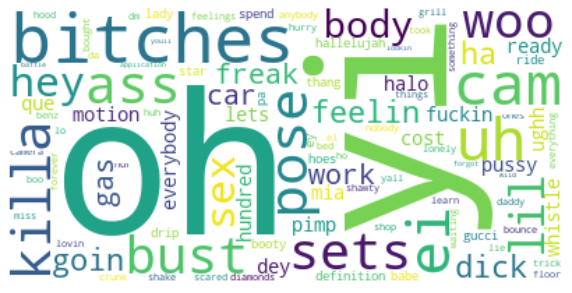

In [79]:
generate_wordcloud(tf_idf[1], 100, "wordcloud1.png")

Community 1 contains a lot more physical and sexual vocabulary. To a smaller extent, it also contains words relating to feelings like "scared", "feelin", "lovin", and "lonely". This community contains some of the most famous female artists in the whole dataset like Rihanna, Nicki Minaj, and Beyoncé as well as some of the most influential contemporary artists in general. 

#### Community #2

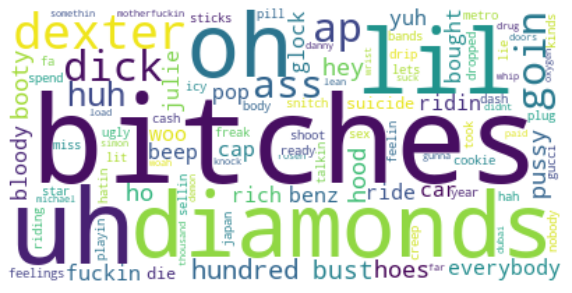

In [80]:
generate_wordcloud(tf_idf[2], 100, "wordcloud2.png")

Community 2 also exhibits strong sexual vocabulary but also many references to luxury items like cars and fashio. We can see that "rich" is one of the common words for this community. We notice many young and up-and-coming artists in this category.

#### Community #3

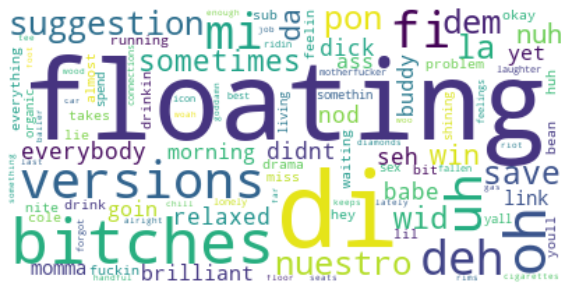

In [81]:
generate_wordcloud(tf_idf[3], 100, "wordcloud3.png")

#### Community #4

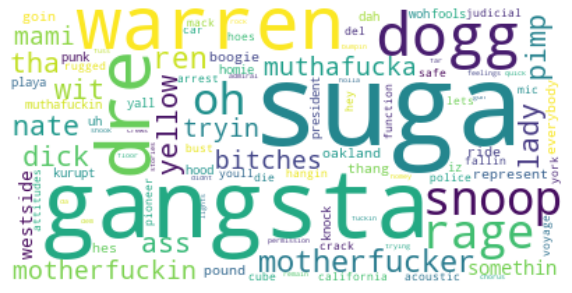

In [82]:
generate_wordcloud(tf_idf[4], 100, "wordcloud4.png")

These terms contain many references to well-established artists like Dr. Dre and Snoop Dogg, and Ice Cube. The median year of release year in this category is much higher than for most other categories (2003 as compared to 2017-2018). We see many themes connected to crime ("gangsta", "rage", "judicial", "president") and belonging ("westside", "hood", "homie") and less to sex and luxury.

#### Community #5

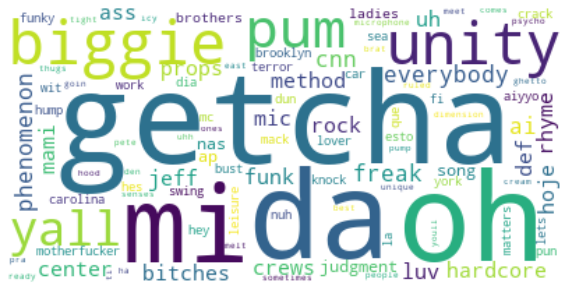

In [83]:
generate_wordcloud(tf_idf[5], 100, "wordcloud5.png")

This community also contains some of the well-known OG artists with a median year of release 1999 (e.g. Biggie). We still detect some terms of protest like "terror" and "judgment" and can see how they represent the hip-hop field in its youth.

#### Community #6

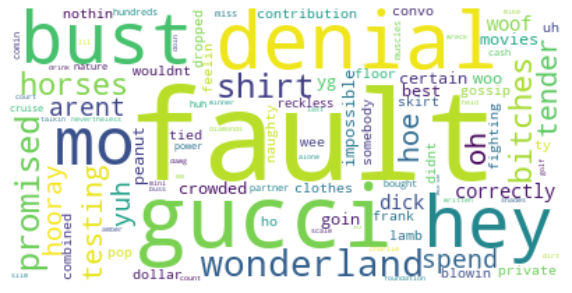

In [84]:
generate_wordcloud(tf_idf[6], 100, "wordcloud6.png")

This community consists only of 4 artists and contains diverse thematics. Interestingly enough, "fault" and "denial" are some of the most common terms.

#### Community #7

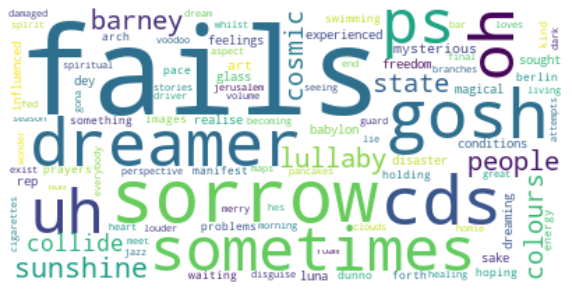

In [85]:
generate_wordcloud(tf_idf[7], 100, "wordcloud7.png")

Community 7 contains many introspective and spiritual terms.

#### Community #8

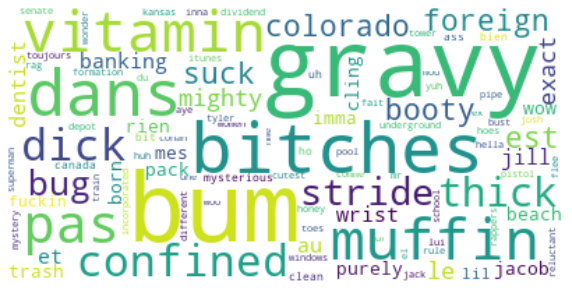

In [86]:
generate_wordcloud(tf_idf[8], 100, "wordcloud8.png")

#### Community #9

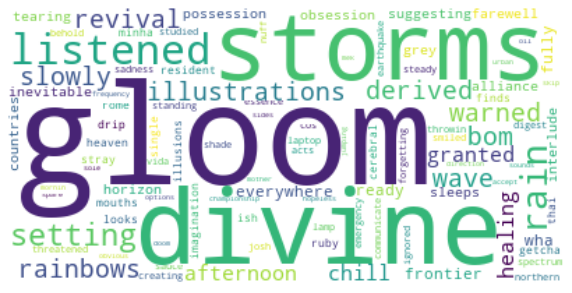

In [87]:
generate_wordcloud(tf_idf[9], 100, "wordcloud9.png")

Community 9 also contains many introspective words. This community only contains 2 artists.

### What are the Sentiments of Each Community? 

We will conduct sentiment analysis on each community by evaluating each song lyrics.

In [91]:
# dictionary that maps a word to its happiness score
sentiment_score = pd.Series(df_sentiment.happiness_average.values,index=df_sentiment.word).to_dict()

In [99]:
# calculate frequency distribution of a token list
def getNormalizedFreqDistrib(tokens, n):
    fdist = FreqDist(tokens)
    total_len=len(tokens)
    arrayProbabilities = []
    
    for word, frequency in fdist.most_common(n):
        arrayProbabilities.append([word, frequency/total_len])
        
    return arrayProbabilities

In [100]:
def hedonometer(tokens, n):
    df = getNormalizedFreqDistrib(tokens, n)

    totalScore = 0
    
    for word, weight in df:
        totalScore += weight * sentiment_score[word]
        
    return totalScore

In [107]:
sentiment_scores = {}
for i in range(N):
    sentiment_scores[i] = hedonometer(community_tokens[i], 5000)
    print("Community {} happiness score: {}".format(i, round(sentiment_scores[i], 2)))

Community 0 happiness score: 5.39
Community 1 happiness score: 5.37
Community 2 happiness score: 5.29
Community 3 happiness score: 5.39
Community 4 happiness score: 5.32
Community 5 happiness score: 5.38
Community 6 happiness score: 5.29
Community 7 happiness score: 5.51
Community 8 happiness score: 5.3
Community 9 happiness score: 5.51


In [108]:
min(sentiment_scores.values())

5.285568381063681

In [109]:
max(sentiment_scores.values())

5.50905071967099

Contrary to our expectations, the sentiment scores for the different communities are not very widely spread. The happiness score for the two "introspective" communities, 7 and 9, is slightly higher which could be due to their use of spiritual words like "divine" and "dreamer" that traditionally have a higher happiness score than more mundane words. Since mundane words tend to have neutral scores, we can see why the values are around the average.

### Sentiment score distribution

We are going to plot the sentiment score spread for each community by computing the weighted happiness score of each song.

In [131]:
def community_dist(community, limit):
    # calculate happiness score per song in community
    scores = []
    lyrics_path = "./cleanlyrics"
    with open('communities.json', 'r') as f:
        communities = json.load(f)
        for i in range(len(songs_df)):
            song = songs_df.iloc[i]
            artist = song["artist_name_spotify"]
            if artist in communities.keys() and communities[artist] == community:
                filename = lyrics_path + "/" + song["song_filename"].replace("json", "txt")
                with open(filename, "r", encoding="utf-8") as f:
                    text = f.read().lower()
                    tokenizer = RegexpTokenizer(r"\w+")
                    tokens = tokenizer.tokenize(text)
                    tokens = [token for token in tokens if token in word_list]
                    scores.append(hedonometer(tokens, limit))
                
    return scores

In [117]:
def plot_happiness_distribution(scores, community, color, alpha=0.4, bins=50):
    plt.figure(figsize=(10,4))
    plt.title("Sentiment score distribution: community {}".format(community), fontsize=15)
    plt.xlabel("Happiness score")
    plt.ylabel("Song count")
    plt.hist(scores, bins, color = color, alpha = 0.8)
    return plt.gcf()

In [118]:
# optional: we use the Seaborn data visualisation package to plot the distributions
# comment out this cell if you do not want to use Seaborn
import seaborn as sns
sns.set(style="darkgrid")

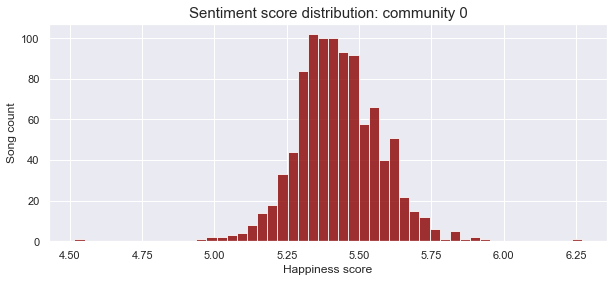

In [134]:
scores = community_dist(0, 5000)
fig0 = plot_happiness_distribution(scores, 0, color="darkred")

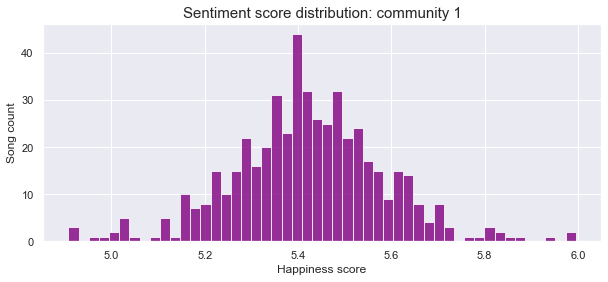

In [135]:
scores = community_dist(1, 5000)
fig1 = plot_happiness_distribution(scores, 1, color="purple")

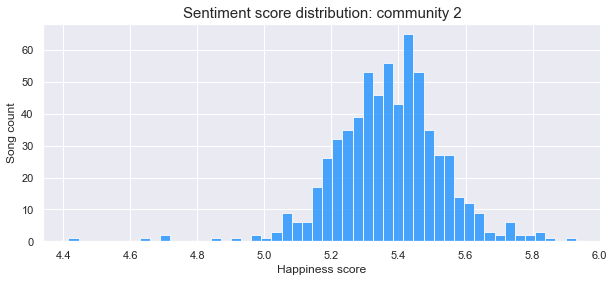

In [136]:
scores = community_dist(2, 5000)
fig2 = plot_happiness_distribution(scores, 2, color="dodgerblue")

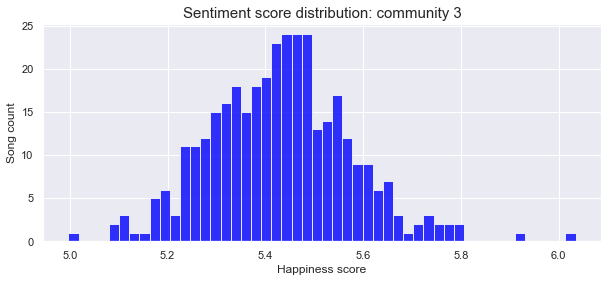

In [137]:
scores = community_dist(3, 5000)
fig3 = plot_happiness_distribution(scores, 3, color="blue")

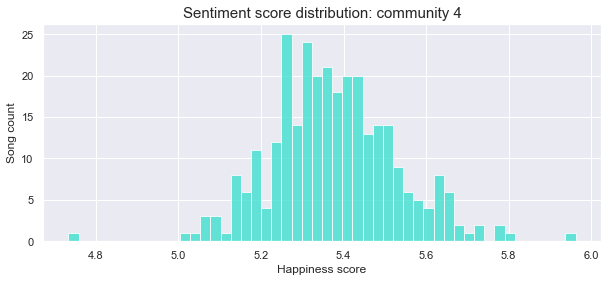

In [138]:
scores = community_dist(4, 5000)
fig4 = plot_happiness_distribution(scores, 4, color="turquoise")

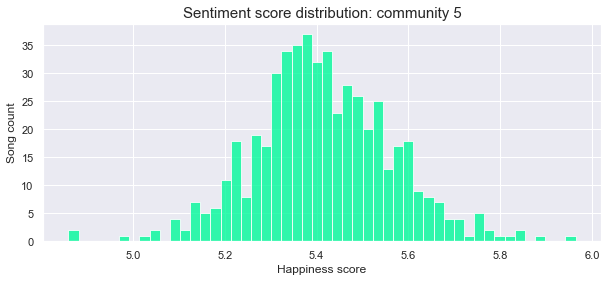

In [139]:
scores = community_dist(5, 5000)
fig5 = plot_happiness_distribution(scores, 5, color="mediumspringgreen")

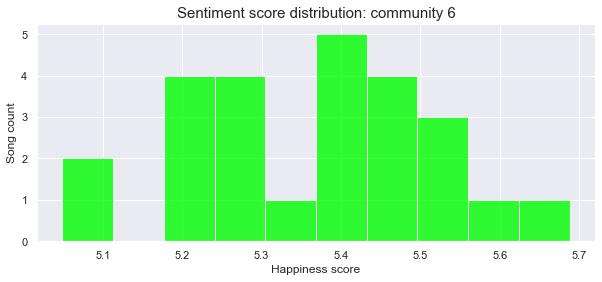

In [140]:
scores = community_dist(6, 5000)
fig6 = plot_happiness_distribution(scores, 6, color="lime", bins=10)

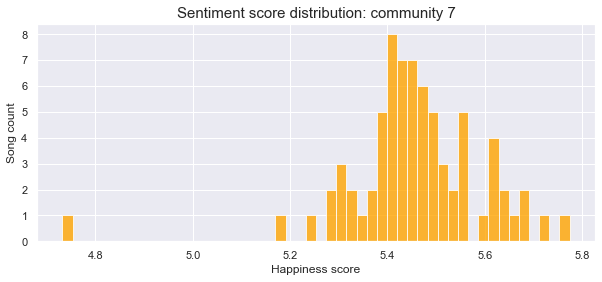

In [141]:
scores = community_dist(7, 5000)
fig7 = plot_happiness_distribution(scores, 7, color="orange")

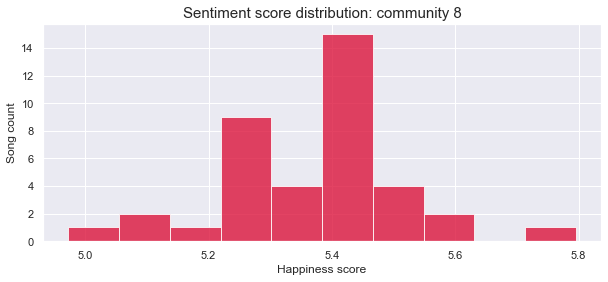

In [142]:
scores = community_dist(8, 5000)
fig8 = plot_happiness_distribution(scores, 8, color="crimson", bins=10)

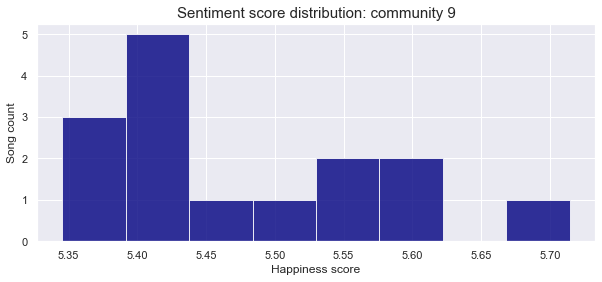

In [143]:
scores = community_dist(9, 5000)
fig9 = plot_happiness_distribution(scores, 9, color="navy", bins=8)

It looks like most of the communities have similar average sentiment scores following mostly normal distributions. So although the lyrics of each community might be quite different, their sentiments end up being quite similar. 

### Median year for each community

In [146]:
with open('communities.json', 'r') as f:
    communities = json.load(f)

songs_df["community"] = songs_df["artist_name_spotify"].map(communities)
songs_df["year"] = songs_df.dropna()["song_date"].apply(lambda date: date.split("-")[0])
get_year_median = lambda c: pd.to_numeric(songs_df[songs_df["community"] == c].dropna()["year"]).median()
list(map(get_year_median, list(range(10))))

[2018.0,
 2018.0,
 2018.0,
 2018.0,
 2003.0,
 1999.0,
 2018.0,
 2017.0,
 2018.0,
 2017.0]

As previously mentioned, communities 4 and 5 are much older than the rest with the majority of the lyrics being released in 2003 and 1999 respectively.

### Named Entity Recognition
Hip hop songs often reflect relevant social issues. By extracting all named entities in lyrics we can gain insight into the themes each performer incorporates in his/her work. 

NLTK's named entity recognition capabilities are very limited. Instead, we are going to use the "en_core_web_sm" model available from the Spacy module for state-of-the-art named entity recognition.

Note: this is an external tool that was not used in the course, so it may take some time to set up.

In [ ]:
# spacy is a powerful NLP tool we will use for named entity recognition
# uncomment the following lines to install spacy on conda

# import sys
# !conda install --yes --prefix {sys.prefix} numpy

In [147]:
import spacy

In [148]:
# load named entity recognition model
nlp = spacy.load("en_core_web_sm")

In [ ]:
reference_dict = {}
lyrics_path = "./lyrics_with_punctuation/"
for i in range(len(songs_df)):
    song = songs_df.iloc[i]
    artist = song["artist_name_spotify"]
    filename = lyrics_path + "/" + song["song_filename"].replace(".json", ".txt")
    with open(filename, "r", encoding="utf-8") as f:
        text = f.read()
        doc = nlp(text)
        references = [(X.text, X.label_) for X in doc.ents]
        if artist in communities.keys():
            c = communities[artist]
            if c not in reference_dict.keys():
                reference_dict[c] = []
            reference_dict[c] += list(set(references))

In [ ]:
# save dictionary in a file
reference_dist = {'reference_dict': reference_dict}

with open('references.txt', 'w') as file:
     file.write(json.dumps(reference_dict))

In [152]:
with open('references.txt', 'r', encoding="utf-8") as f:
     reference_dict = json.loads(f.read())

In [169]:
def get_top_references(community, limit):
    if int(community) < len(reference_dict.keys()):
        d = reference_dict[community]
        exclude = ["LANGUAGE", "DATE", "TIME", "PERCENT", "MONEY", "QUANTITY", "ORDINAL", "CARDINAL"]
        pairs = [pair for pair in d if pair[1] not in exclude]
        pairs = [(pair[0], pair[1]) for pair in pairs]
        d = sort_freq_dict(dict(Counter(pairs)))
        sliced = islice(d.items(), limit)
        return OrderedDict(sliced)

In [171]:
get_top_references("0", 20)

OrderedDict([(('Baby', 'PRODUCT'), 126),
             ((' ', 'NORP'), 90),
             (('Said', 'PERSON'), 83),
             (('Nah', 'PERSON'), 80),
             (('Cause', 'GPE'), 71),
             (('Dem', 'NORP'), 70),
             (('Them', 'ORG'), 64),
             (('Niggas', 'ORG'), 63),
             (('Tryna', 'PERSON'), 60),
             (('Gyal', 'PERSON'), 58),
             (('London', 'GPE'), 56),
             (('Fuck', 'PERSON'), 47),
             (('Ai', 'PERSON'), 46),
             (('Love', 'WORK_OF_ART'), 40),
             (('Girl', 'PERSON'), 39),
             (('Yo', 'PERSON'), 38),
             (('Ooh', 'ORG'), 37),
             (('Wanna', 'PERSON'), 37),
             (('Bitch', 'PERSON'), 37),
             (('Nigga', 'ORG'), 36)])

As named entity recognition is not yet a perfected task, we do not get perfect results but with manual review we can see the entities. In this case, the main entity for community 0 is London. As previously mentioned, the majority of artists are from the UK.

For a quick summary of the top named entities for each community, we have ...

* 0: London, Gucci, Henny, Nike, Cali
* 1: Gucci, Henny, New York, Chanel, London
* 2: Bentley, Chanel, Gucci, Glock, Patek
* 3: Atlanta, Gucci, Henny, Bentley, Paris
* 4: Dre, Snoop, California, New York, Ice Cube
* 5: Brooklyn, New York, Queens, Earth, Wu-Tang
* 6: Mike, Porsche, Jordan, EarDrummers, Kim Kardashian
* 7: Jack, Africa, Ben, Jerusalem, Faberge
* 8: Mayo, Instagram, DBangz, Henny, Jack
* 9: IAMDDB, DDB, Bougie, Henny, Uber


We see a lot of references to luxury clothing, alcohol, and car brands as expected. What is interesting to note is that we can see that some communities are based aroud location. For example, Community 5 refernces many NYC neighbourhoods, (and an inspection of community 5 will show many east-coast and New York based artists, while Community 4 references California and many iconic west coast rappers (Dr. Dre, Snoop Dogg, and Ice Cube). 

## Part 4: Discussion

### Successes

We are quite pleased with the results of our analysis. Our results showed a lot of the insights we were hoping to find. Some highlights are the most influential artists (denoted by eigenvector centrality), up-and-coming artists, and especially community detection. 

We found that the community detection algorithm combined with the lyrics analysis was able to extract many rich insights. For example, it was immediately clear that the wordcloud of community zero was quite distinct from others (because all UK rappers were clustered in this community, who have very unique slang). 

Through named entity recognition, we were even able to see what the most common topics are among rap music for each community, which gives some insights into clusters based on location -- super cool!



### Improvements

One thing that could've been added was a temporal analysis of our network. One thing we could have done is see how the rap collaboration network grew over time, from the early 90's to today, perhaps by repeating this exercise with the relevant artists of each 2-3 year period. Since the rap music industry is rapidly evolving, it would have been interesting to trends in collaborations and why certain artists choose to work or not work with each other. 

A second thing we could have looked at was the audio features of each song, and analyzed how that differed between communities. The Spotipy API has support for this. But unfortunately, we did not have time for this. 

Lastly, our Sentiment Analysis of lyrics didn't provide many rich insights. Most sentiment distributions were quite similar to begin with. 

## Part 5: Contributions

### Atharva
* All of the Network Analysis (Degree Distributions, Clustering, etc)
* Cleaning the lyrics Dataset for TF-IDF
* Formatting/Standardization of Notebooks
* Conclusion/Discussion

### Stéphane
* Data collection from spotify
* Building the Network (with Atharva)
* Website
* Network Visualization

### Anelia
* Lyrics data collection through Genius API  
* TF-IDF calculation  
* Sentiment analysis  
* Named entity recognition  